# Overview
todo
- contourの最小値length_minをリアルスケールに治す(そうしないと画像毎に異なるスケールになってしまう)

# Const

In [1455]:
NB = '030'

DIR_TRAIN = './../data_ignore/input/train/'
DIR_TEST = './../data_ignore/input/test/'
DIR_WIFI = './../data_ignore/input/wifi/'
PATH_SUB = './../data_ignore/input/sample_submission.csv'
PATH_99_SUB = './../data/input/floor_99per_acc_sub.csv'
DIR_SAVE_IGNORE = f'./../data_ignore/nb/{NB}/'
DIR_SAVE = f'./../data/nb/{NB}/'
floor_map = {"B2":-2.0, "B1":-1.0, "F1":0.0, "F2": 1.0, "F3":2.0, "F4":3.0, "F5":4.0, "F6":5.0, "F7":6.0,"F8":7.0, "F9":8.0,
             "1F":0.0, "2F":1.0, "3F":2.0, "4F":3.0, "5F":4.0, "6F":5.0, "7F":6.0, "8F": 7.0, "9F":8.0}

site_5d27075f03f801723c2e360f = {
    'B1': 240.0,
    'F1': 211,
    'F2': 211,
    'F3': 211,
    'F4': 211.0,
    'F5': 135.3,
    'F6': 135.3,
    'F7': 135.3,
}

# Import everything I need:)

In [1205]:
import os
import cv2
import json
import types
import random
import pickle
import builtins
import numpy as np
import pandas as pd
from glob import glob
from PIL import Image
import scipy.ndimage as ndimage
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import warnings
warnings.filterwarnings('ignore')

In [3]:
def imports():
    for name, val in globals().items():
        # module imports
        if isinstance(val, types.ModuleType):
            yield name, val

            # functions / callables
        if hasattr(val, '__call__'):
            yield name, val


def noglobal(f):
    '''
    ref: https://gist.github.com/raven38/4e4c3c7a179283c441f575d6e375510c
    '''
    return types.FunctionType(f.__code__,
                              dict(imports()),
                              f.__name__,
                              f.__defaults__,
                              f.__closure__
                              )



# Preparation

In [4]:
# seed_everything(config['globals']['seed'])
pd.set_option('display.max_rows', 500)

if not os.path.exists(DIR_SAVE_IGNORE):
    os.makedirs(DIR_SAVE_IGNORE)
if not os.path.exists(DIR_SAVE):
    os.makedirs(DIR_SAVE)

# EDA

In [491]:
path_list_json = sorted(glob('./../data_ignore/input/metadata/*/*/floor_info.json'))
path_list = sorted(glob('./../data_ignore/input/metadata/*/*/*.png'))

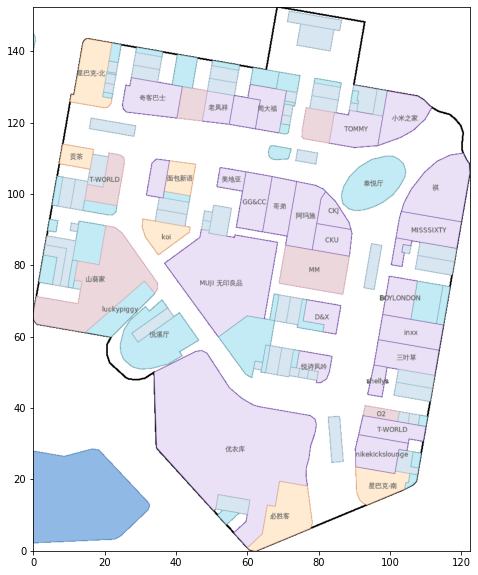

In [1501]:
idx_image = 1
# idx_image = 109
# idx_image = 898
# idx_image = 925
site = path_list[idx_image].split('/metadata/')[-1].split('/')[0]

with open(path_list_json[idx_image]) as json_file:
    json_data = json.load(json_file)
width_meter = json_data["map_info"]["width"]
height_meter = json_data["map_info"]["height"]

img_raw = cv2.imread(path_list[idx_image], -1)
logics = np.where(img_raw[:, :, 3] == 0)
img_raw[logics] = [255, 255, 255, 255]
img = img_raw.copy()
img_ori = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
img_hsv = cv2.cvtColor(img_raw, cv2.COLOR_BGR2HSV)
img = cv2.cvtColor(img, cv2.COLOR_BGRA2GRAY)
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # RGB2〜 でなく BGR2〜 を指定


fig = plt.figure(figsize=(10, 10))
fig.patch.set_facecolor('white')
# plt.imshow(img_ori)
plt.imshow(np.asarray(img_ori), extent=(0, width_meter, 0, height_meter))
plt.show()

<br>

thresholdで２値化

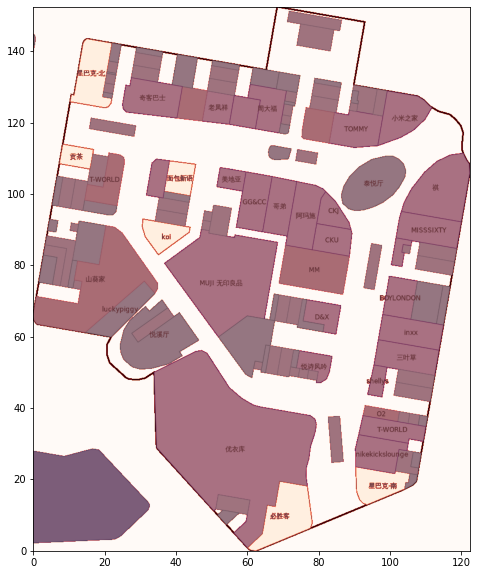

In [1502]:
# thre = 50
thre = 230
thre, region = cv2.threshold(img, thre, 1, cv2.THRESH_BINARY_INV)

fig = plt.figure(figsize=(10, 10))
fig.patch.set_facecolor('white')
plt.imshow(img_ori, extent=(0, width_meter, 0, height_meter))
plt.imshow(region, cmap="Reds", alpha=0.5, extent=(0, width_meter, 0, height_meter))
# cv2.
plt.show()

<br>

モルフォロジー変換

<br>

穴埋め

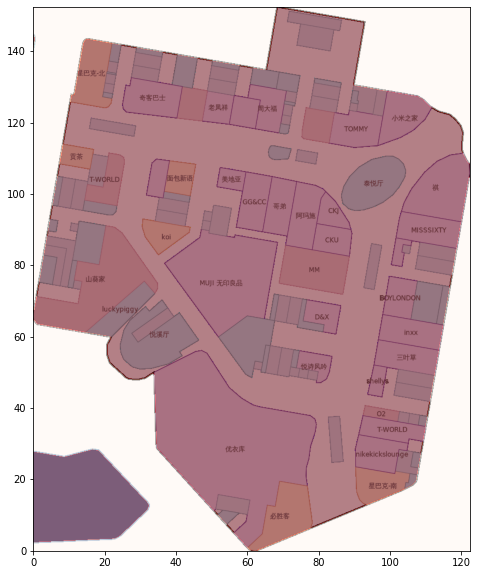

In [1503]:
# region_fill = region_mor.copy()
region_fill = ndimage.binary_fill_holes(region).astype(np.uint8)

# ちょっと内側に狭める
s = 5
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (s, s))
region_fill = cv2.morphologyEx(region_fill, cv2.MORPH_ERODE, kernel)

_region = region_fill

fig = plt.figure(figsize=(10, 10))
fig.patch.set_facecolor('white')
plt.imshow(img_ori, extent=(0, width_meter, 0, height_meter))
plt.imshow(_region, cmap="Reds", alpha=0.5, extent=(0, width_meter, 0, height_meter))

<br>

contour取得

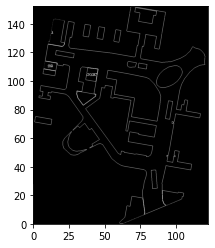

In [1504]:
# contour取得
thre = 230
thre, region_white = cv2.threshold(img, thre, 1, cv2.THRESH_BINARY_INV)
# region_white = cv2.GaussianBlur(region_white, (9, 9), 3)
contours, hierarchy = cv2.findContours(region_white, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# 短いcontourの削除 & region_fillとの論理積
length_min = 100
contours_new = []
for contour in contours:
    contour_ = contour[:, 0, :]
    contour_new = []
    for p in contour_:
        if region_fill[p[1], p[0]]==1:
            contour_new.append([[p[0], p[1]]])
    if len(contour_new)>=length_min:
        contours_new.append(np.array(contour_new).astype(np.int32))
        
# region_contourの作成
region_contour = np.zeros_like(img)
for contour in contours_new:
    contour_ = contour[:, 0, :]
    for p in contour_:
        region_contour[p[1], p[0]] = 1
plt.imshow(region_contour, cmap='Greys_r', extent=(0, width_meter, 0, height_meter))

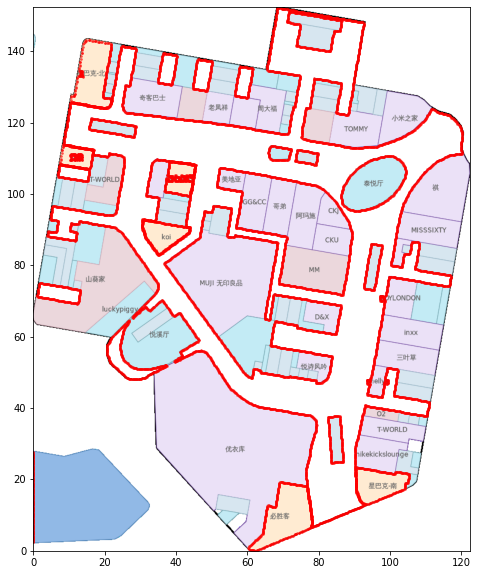

In [1505]:
# 建物の壁に近い部分のcontourを削除
_region_contour = np.flipud(region_contour)
contour_x = []
contour_y = []
for idx_y in range(_region_contour.shape[0]):
    for idx_x in range(_region_contour.shape[1]):
        if _region_contour[idx_y, idx_x]==1:
            contour_y.append(idx_y)
            contour_x.append(idx_x)

contour_x = np.asarray(contour_x)*width_meter/img.shape[1]
contour_y = np.asarray(contour_y)*height_meter/img.shape[0]

fig = plt.figure(figsize=(10, 10))
fig.patch.set_facecolor('white')
plt.imshow(img_ori, extent=(0, width_meter, 0, height_meter))

start = 0
reso = 1
plt.scatter(contour_x[start::reso], contour_y[start::reso], s=3, color='r', alpha=0.5)

<br>

contour毎に見てみる

In [1506]:
df_train_grid = pd.read_csv('./../data/input/train_waypoints.csv')

In [1507]:
site = path_list[idx_image].split('/metadata/')[-1].split('/')[0]
floor = path_list[idx_image].split('/metadata/')[-1].split('/')[1]
df_site_floor = df_train_grid.query('site==@site & floorNo==@floor')
xy = df_site_floor[['x', 'y']].values
x_train = xy[:, 0]
y_train = xy[:, 1]

site, floor

('5a0546857ecc773753327266', 'F1')

In [1508]:
model = NearestNeighbors(metric='euclidean', n_neighbors=1)
model.fit(df_site_floor[['x', 'y']].values)

NearestNeighbors(metric='euclidean', n_neighbors=1)

dist_mean: 2.2177


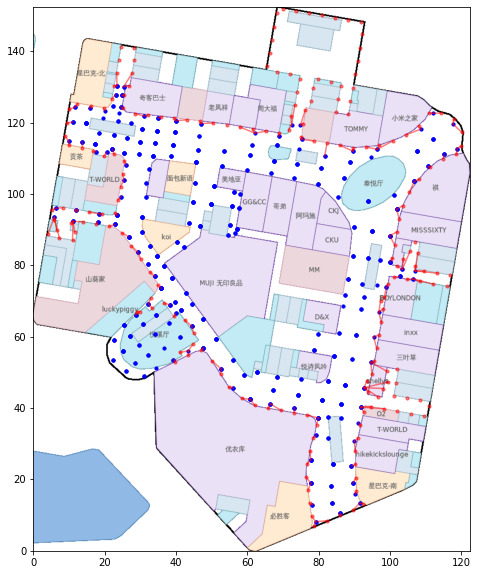

In [1538]:
# idx = 12
idx = 24
start = 10
reso = 24
dist_min = 7

x = contours_new[idx][:, 0, :][:, 0][start::reso]
y = contours_new[idx][:, 0, :][:, 1][start::reso]
y = np.flipud(np.arange(img.shape[0]).astype(int))[y]  # flipさせる
x = x*width_meter/img.shape[1]
y = y*height_meter/img.shape[0]

# 距離の計算
distances, indexes  = model.kneighbors(np.array([x, y]).T)
logics = (distances<=dist_min)[:, 0]
dist_mean = distances[logics].mean()
print(f'dist_mean: {dist_mean:.4f}')


fig = plt.figure(figsize=(10, 10))
fig.patch.set_facecolor('white')
# plt.imshow(img_ori)
plt.imshow(np.asarray(img_ori), extent=(0, width_meter, 0, height_meter))

for i in range(len(indexes)):
    if distances[i] <= dist_min:
        plt.plot([x[i], x_train[indexes[i]]], [y[i], y_train[indexes[i]]], color='red', alpha=0.5)
plt.scatter(x_train, y_train, s=10, color='blue')
plt.scatter(x, y, s=10, color='r', alpha=0.5)

# 最適化

28
24


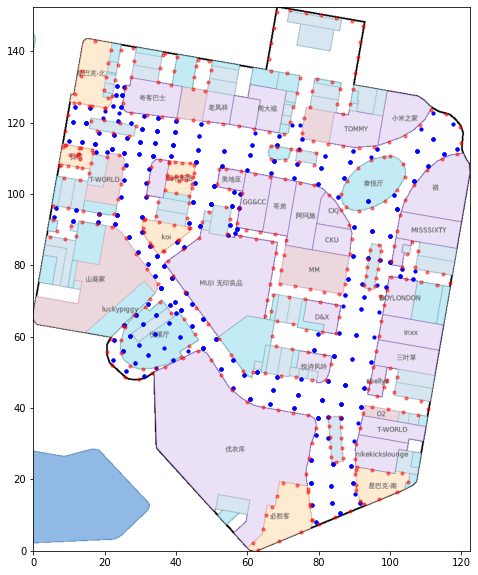

In [1512]:
dist_min = 10

fig = plt.figure(figsize=(10, 10))
fig.patch.set_facecolor('white')
plt.imshow(np.asarray(img_ori), extent=(0, width_meter, 0, height_meter))
plt.scatter(x_train, y_train, s=10, color='blue')


for idx in range(len(contours_new)):
    best_dist_mean = 1000
    best_reso = None
    best_start = None
    best_indexes = None
    best_distances = None
    for reso in range(10, 30):
        x = contours_new[idx][:, 0, :][:, 0][start::reso]
        for start in range(0, len(x)):
            x = contours_new[idx][:, 0, :][:, 0][start::reso]
            y = contours_new[idx][:, 0, :][:, 1][start::reso]
            y = np.flipud(np.arange(img.shape[0]).astype(int))[y]  # flipさせる
            x = x*width_meter/img.shape[1]
            y = y*height_meter/img.shape[0]

            distances, indexes  = model.kneighbors(np.array([x, y]).T)
            logics = (distances<=dist_min)[:, 0]
            dist_mean = distances[logics].mean()
            if dist_mean < best_dist_mean:
                best_dist_mean = dist_mean
                best_reso = reso
                best_start = start
                best_indexes = indexes
                best_distances = distances

    if best_dist_mean!=1000:
        # 最適化した値でプロット
        x = contours_new[idx][:, 0, :][:, 0][best_start::best_reso]
        y = contours_new[idx][:, 0, :][:, 1][best_start::best_reso]
        y = np.flipud(np.arange(img.shape[0]).astype(int))[y]  # flipさせる
        x = x*width_meter/img.shape[1]
        y = y*height_meter/img.shape[0]

#         for i in range(len(best_indexes)):
#             if best_distances[i] <= dist_min:
#                 plt.plot([x[i], x_train[best_indexes[i]]], [y[i], y_train[best_indexes[i]]], color='red', alpha=0.5)
        plt.scatter(x, y, s=10, color='r', alpha=0.5)
print(best_reso)
print(best_start)

# -------

# 全てのフロアを最適化

In [1453]:
_, img, x, y = get_extra_grid_optim(path_list[idx], width_meter, height_meter, df_site_floor)

In [1576]:
@noglobal
def get_extra_grid_optim(path_img, width_meter, height_meter, df_site_floor):
    img_raw = cv2.imread(path_img, -1)
    logics = np.where(img_raw[:, :, 3] == 0)
    img_raw[logics] = [255, 255, 255, 255]
    img = img_raw.copy()
    img_ori = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img_raw, cv2.COLOR_BGR2HSV)
    img = cv2.cvtColor(img, cv2.COLOR_BGRA2GRAY)
    
    # thre
    thre = 230
    thre, region = cv2.threshold(img, thre, 1, cv2.THRESH_BINARY_INV)
    
    # 穴埋め
    region_fill = ndimage.binary_fill_holes(region).astype(np.uint8)
    s = 5
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (s, s))
    region_fill = cv2.morphologyEx(region_fill, cv2.MORPH_ERODE, kernel)
    
    
    # get contour
#     thre = 230
    thre = 250
    thre, region_white = cv2.threshold(img, thre, 1, cv2.THRESH_BINARY_INV)
    contours, hierarchy = cv2.findContours(region_white, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

    # 短いcontourの削除 & region_fillとの論理積
    length_min = 100
    contours_new = []
    for contour in contours:
        contour_ = contour[:, 0, :]
        contour_new = []
        for p in contour_:
            if region_fill[p[1], p[0]]==1:
                contour_new.append([[p[0], p[1]]])
        if len(contour_new)>=length_min:
            contours_new.append(np.array(contour_new).astype(np.int32))

    # region_contourの作成
    region_contour = np.zeros_like(img)
    for contour in contours_new:
        contour_ = contour[:, 0, :]
        for p in contour_:
            region_contour[p[1], p[0]] = 1

    # 建物の壁に近い部分のcontourを削除
    _region_contour = np.flipud(region_contour)
    contour_x = []
    contour_y = []
    for idx_y in range(_region_contour.shape[0]):
        for idx_x in range(_region_contour.shape[1]):
            if _region_contour[idx_y, idx_x]==1:
                contour_y.append(idx_y)
                contour_x.append(idx_x)

    contour_x = np.asarray(contour_x)*width_meter/img.shape[1]
    contour_y = np.asarray(contour_y)*height_meter/img.shape[0]
    
    #########
    # 最適化 #
    #########
    h, w = img.shape
    if h < w:
        ll = h
        meter = height_meter
    else:
        ll = w
        meter = width_meter
    dist_m_min = 3
    dist_px_min = round(ll/meter*dist_m_min)

    xy = df_site_floor[['x', 'y']].values
    x_train = xy[:, 0]
    y_train = xy[:, 1]
    
    model = NearestNeighbors(metric='euclidean', n_neighbors=1)
    model.fit(df_site_floor[['x', 'y']].values)
    
    list_x = []
    list_y = []
    list_dist = []
    for idx in range(len(contours_new)):
        best_dist_mean = 1000
        best_reso = None
        best_start = None
        best_indexes = None
        best_distances = None
        for reso in range(15, 50):
            x = contours_new[idx][:, 0, :][:, 0][::reso]
            for start in range(0, len(x)):
                x = contours_new[idx][:, 0, :][:, 0][start::reso]
                y = contours_new[idx][:, 0, :][:, 1][start::reso]
                y = np.flipud(np.arange(img.shape[0]).astype(int))[y]  # flipさせる
                x = x*width_meter/img.shape[1]
                y = y*height_meter/img.shape[0]

                distances, indexes  = model.kneighbors(np.array([x, y]).T)
                logics = (distances<=dist_px_min)[:, 0]
                dist_mean = distances[logics].mean()
                if dist_mean < best_dist_mean:
                    best_dist_mean = dist_mean
                    best_reso = reso
                    best_start = start
                    best_indexes = indexes
                    best_distances = distances

        if best_dist_mean<10:
            x = contours_new[idx][:, 0, :][:, 0][best_start::best_reso]
            y = contours_new[idx][:, 0, :][:, 1][best_start::best_reso]
            y = np.flipud(np.arange(img.shape[0]).astype(int))[y]  # flipさせる
            x = x*width_meter/img.shape[1]
            y = y*height_meter/img.shape[0]
            list_x.append(x)
            list_y.append(y)
            list_dist.append(best_distances[:, 0])
    return img_ori, img, np.concatenate(list_x), np.concatenate(list_y), np.concatenate(list_dist)

In [1560]:
sub = pd.read_csv('./../data_ignore/input/sample_submission.csv')
site_path_timestamp = sub.site_path_timestamp.values
site_arr = []
path_arr = []
for val in site_path_timestamp:
    site, path, _ = val.split('_')
    site_arr.append(site)
    path_arr.append(path)
site_arr = np.array(site_arr)
path_arr = np.array(path_arr)

In [1561]:
dir_image = './../data_ignore/input/metadata/'
site_unique = sorted(np.unique(site_arr))

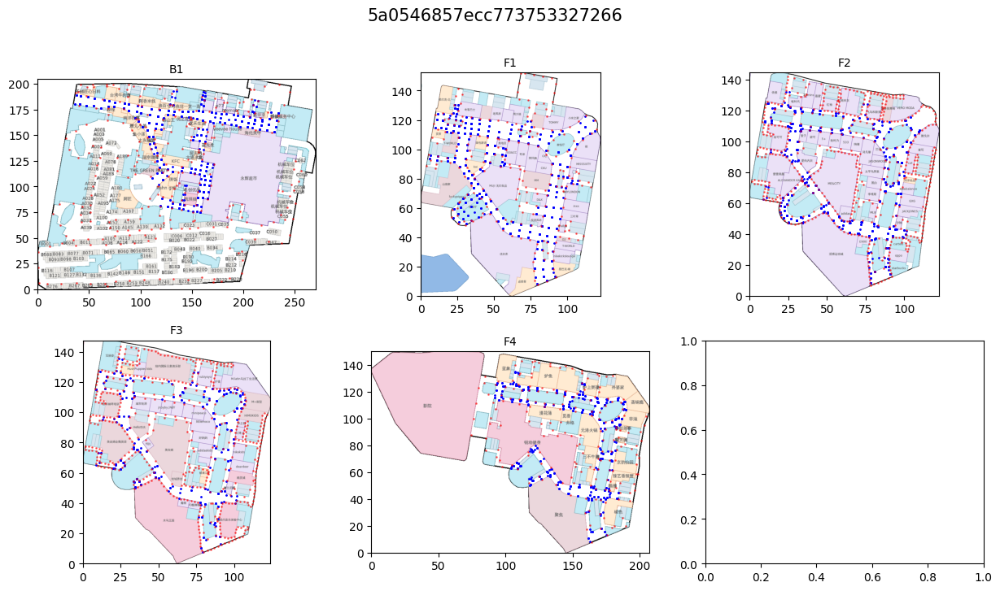

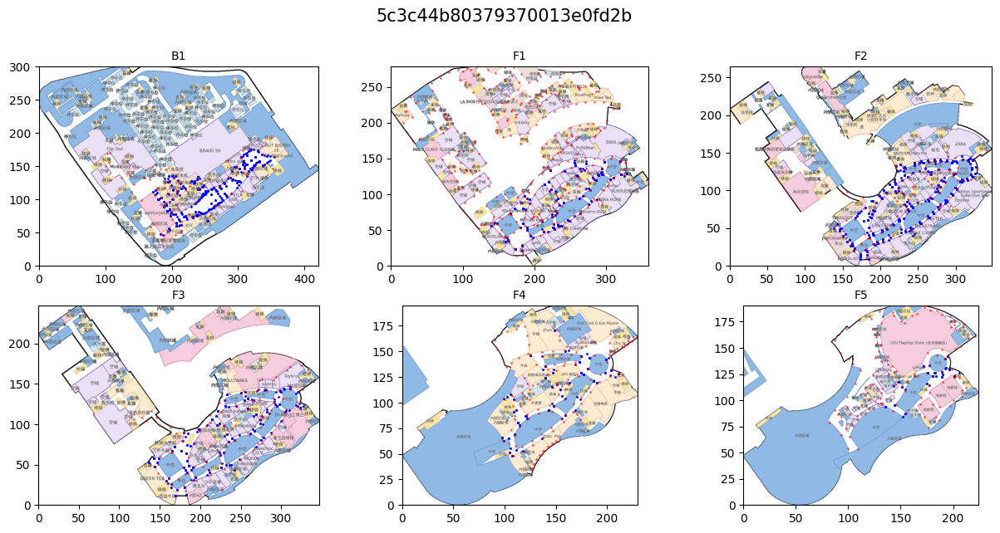

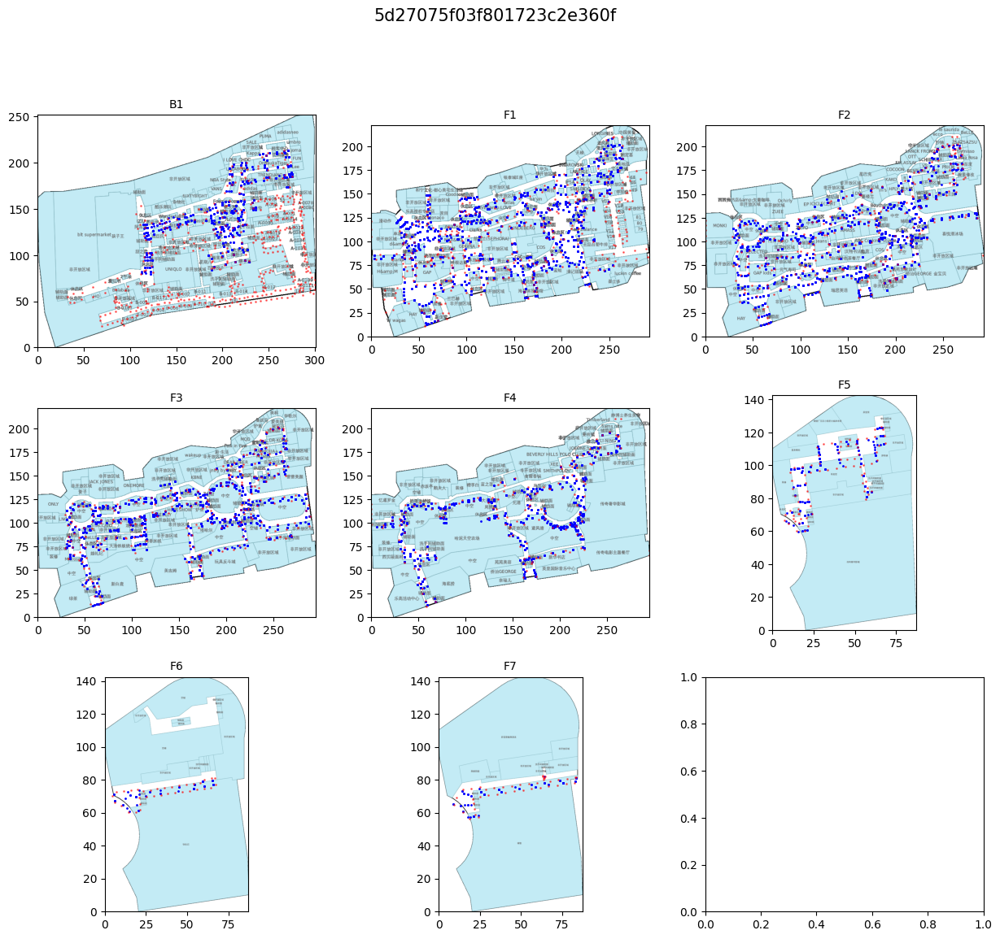

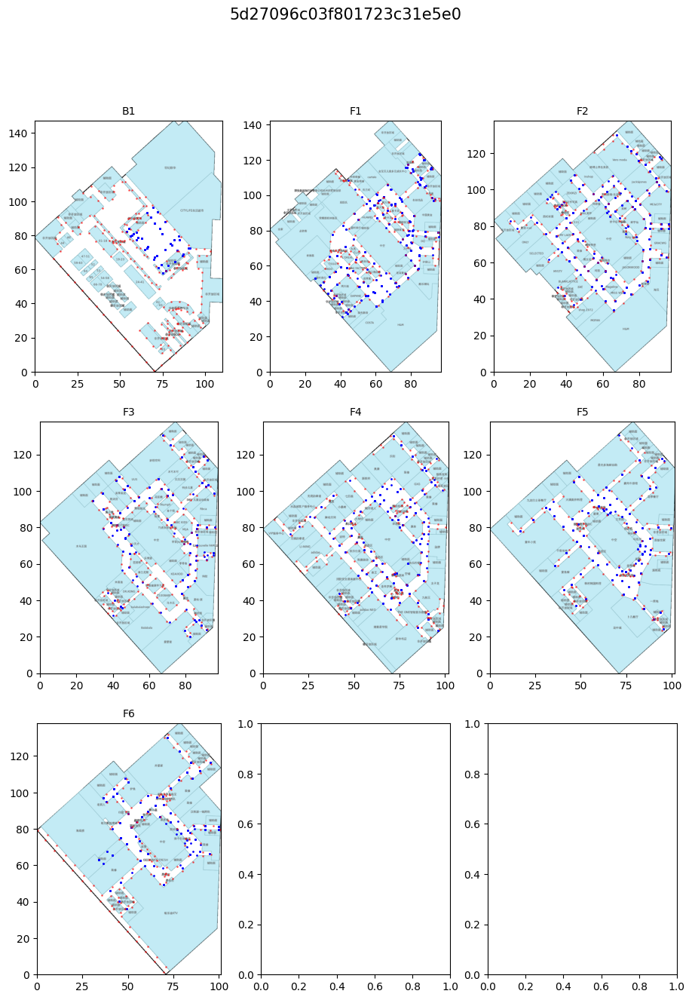

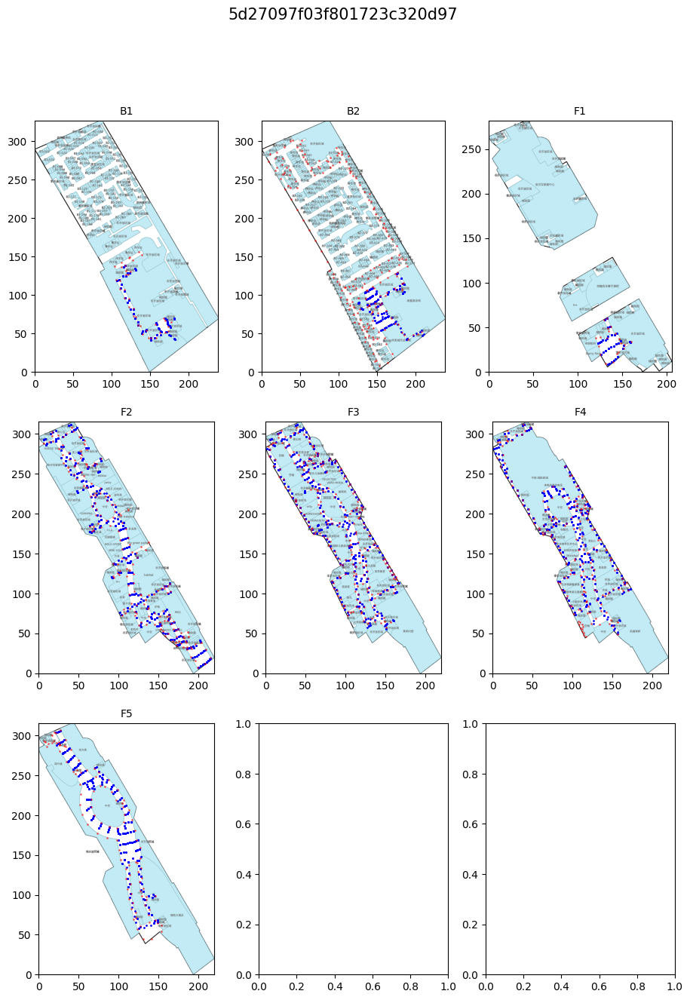

...

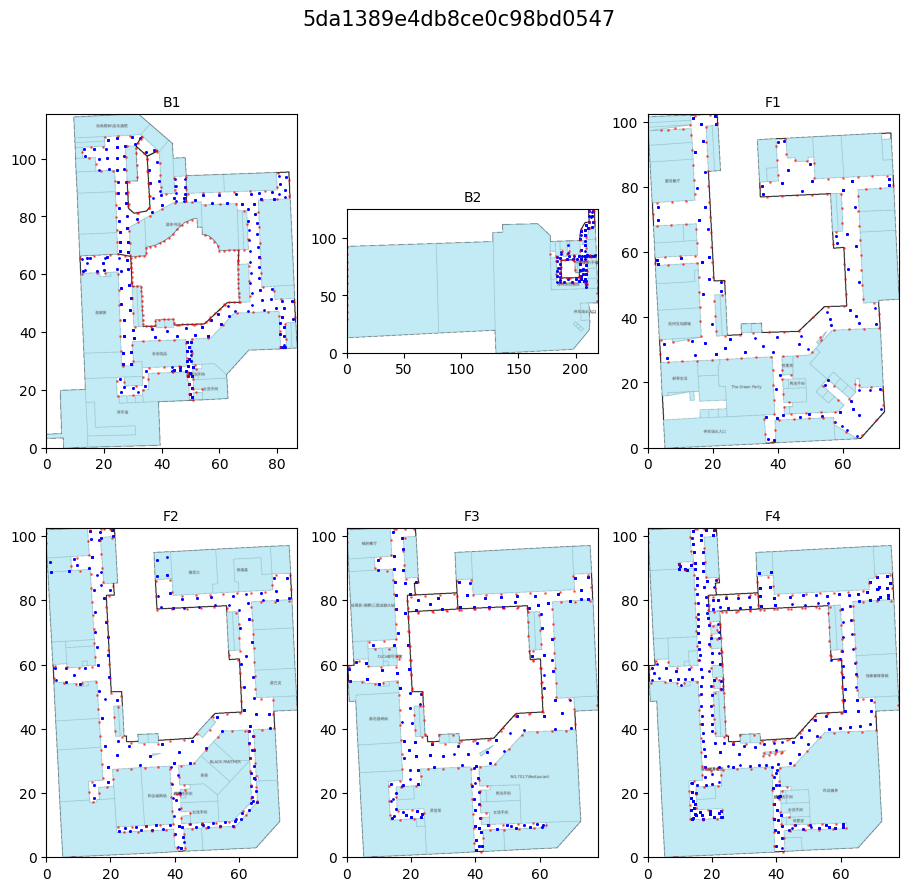

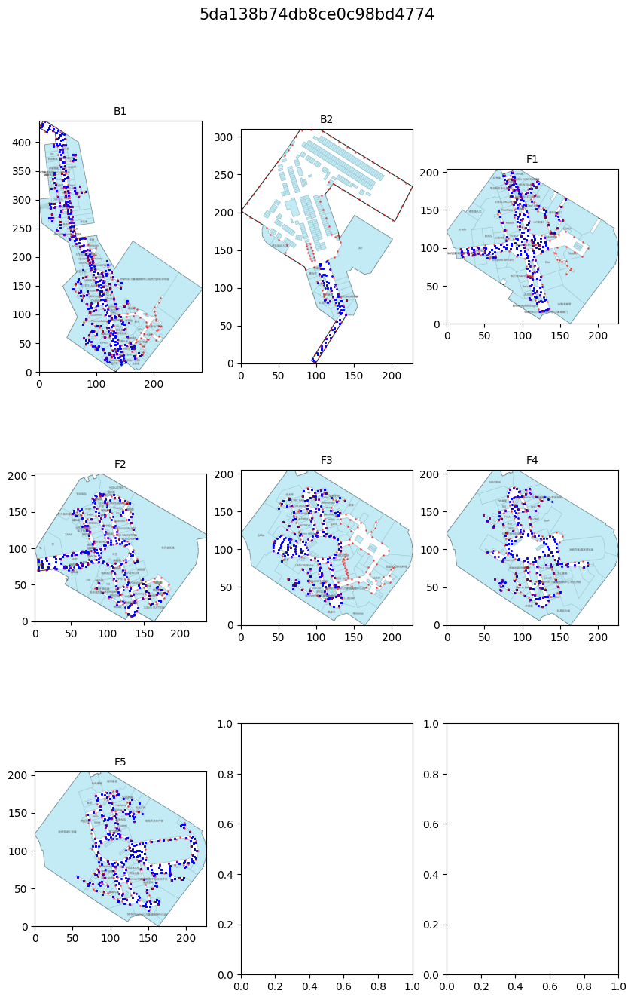

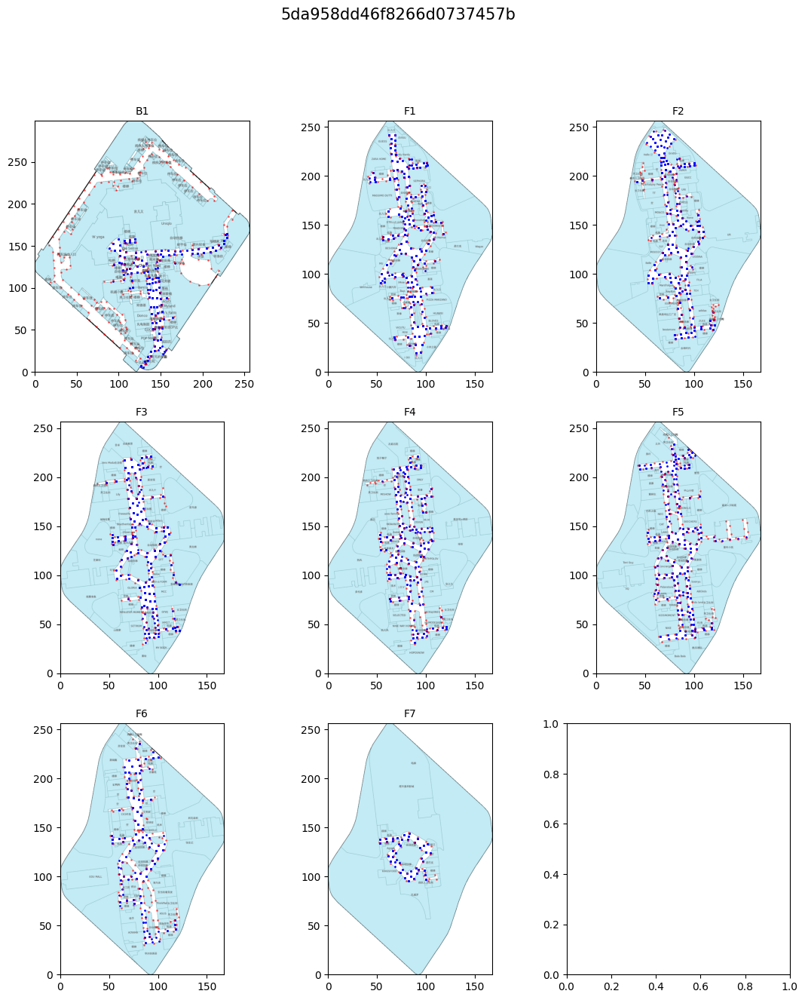

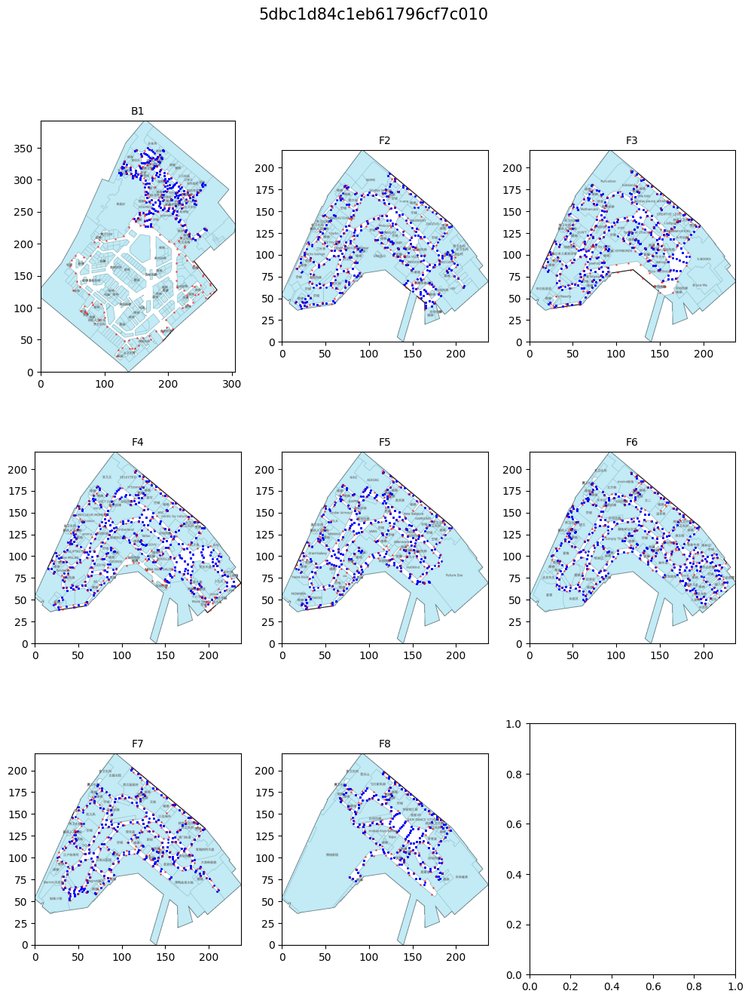

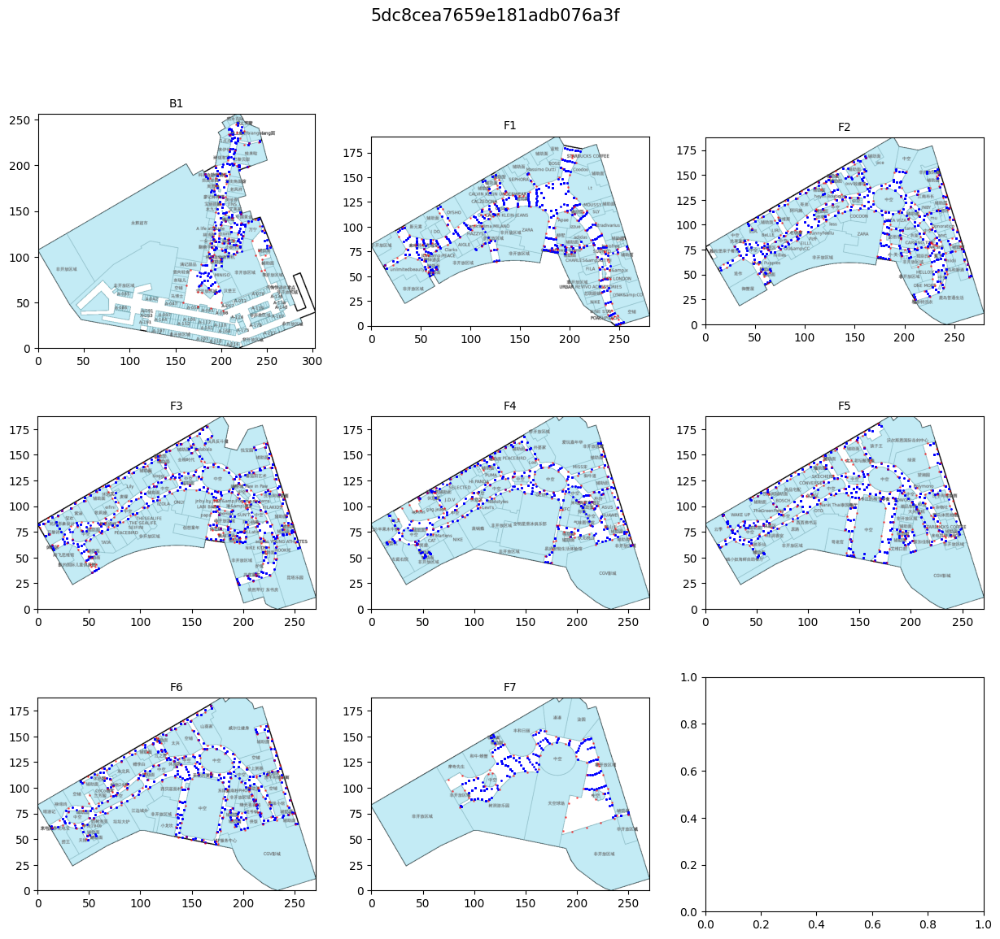

<Figure size 1500x800 with 0 Axes>

<Figure size 1500x700 with 0 Axes>

<Figure size 1500x1300 with 0 Axes>

<Figure size 1100x1500 with 0 Axes>

<Figure size 1100x1500 with 0 Axes>

<Figure size 900x1000 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 500x2000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x400 with 0 Axes>

<Figure size 1500x400 with 0 Axes>

<Figure size 1300x1000 with 0 Axes>

<Figure size 1500x700 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

<Figure size 1500x400 with 0 Axes>

<Figure size 1100x1000 with 0 Axes>

<Figure size 1100x1000 with 0 Axes>

<Figure size 1000x1500 with 0 Axes>

<Figure size 1300x1500 with 0 Axes>

<Figure size 1200x1500 with 0 Axes>

<Figure size 1500x1300 with 0 Axes>

In [1579]:
debug = False
dpi = 100
df_train_grid = pd.read_csv('./../data/input/train_waypoints.csv')

if debug:
    l = 3
else:
    l = None

site_unique = sorted(np.unique(site_arr))

list_df = []
for site in site_unique[:l]:
    floor_list = sorted(glob(f'{dir_image}{site}/*'))
    floor_list = [text.split('/')[-1] for text in floor_list]

    path_json = f'./../data_ignore/input/metadata/{site}/{floor_list[0]}/floor_info.json'
    with open(path_json) as json_file:
        json_data = json.load(json_file)
    _width_meter = json_data["map_info"]["width"]
    _height_meter = json_data["map_info"]["height"]
    s = max(_width_meter, _height_meter)

    n_floor = len(floor_list)
    n_row = int(np.ceil(n_floor / 3))
    w = round(5*3*_width_meter/s)
    h = round(5*n_row*_height_meter/s)
    fig, axs = plt.subplots(n_row, 3, figsize=(w, h), dpi=dpi)
    fig.suptitle(site, fontsize=15)
    fig.patch.set_facecolor('white')
    axs = axs.ravel()

    for i_floor, floor in enumerate(floor_list):
        df_site_floor = df_train_grid.query('site==@site & floorNo==@floor')
        # json
        path_json = f'./../data_ignore/input/metadata/{site}/{floor}/floor_info.json'
        with open(path_json) as json_file:
            json_data = json.load(json_file)
        width_meter = json_data["map_info"]["width"]
        height_meter = json_data["map_info"]["height"]

        # show image
        path_img = f'{dir_image}{site}/{floor}/floor_image.png'
        if site == '5d27075f03f801723c2e360f':
            height_meter_ = site_5d27075f03f801723c2e360f[floor]
        else:
            height_meter_ = height_meter
        img_ori, img_grey, _x, _y, _dist = get_extra_grid_optim(path_img, width_meter, height_meter_, df_site_floor)
        
        # 可視化
        xy = df_site_floor[['x', 'y']].values
        x_train = xy[:, 0]
        y_train = xy[:, 1]
        axs[i_floor].imshow(np.asarray(img_ori), extent=(0, width_meter, 0, height_meter))
        axs[i_floor].scatter(x_train, y_train, s=1, color='blue')
        axs[i_floor].scatter(_x, _y, alpha=0.5, s=1, color='red')
        axs[i_floor].set_title(floor, fontsize=10)
        
        # 保存
        df_ = pd.DataFrame({
            'x': _x,
            'y': _y,
            'distance': _dist
        })
        df_['floor'] = floor
        df_['site'] = site
        list_df.append(df_)
        
    display(fig)
    _ = fig.clear()

# save_dataframe
path = f'{DIR_SAVE}df_extra_grid_edge_optim.csv'
df_extra_grid = pd.concat(list_df, axis=0)
df_extra_grid.to_csv(path, index=False)